# Functional Density Forecasting (FDF) Simulation

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt

import joblib
import logging
from datetime import datetime
from pathlib import Path
from tqdm.auto import tqdm

import sys
sys.path.append('../')
import src.forecasting.simulations      as sim
import src.fda.plots                    as fplt
import src.fda.kde.estimators           as kde
import src.forecasting.cross_validation as crossVal

In [2]:
def format_records(measures, curves, metadata):
    records = []
    
    for m in measures:
        record = {
            **metadata,
            "fold": m["fold"] + 1,
            "KLD": m["KLD"],
            "JSD": m["JSD"],
            "L_1": m["L_1"],
            "L_2": m["L_2"],
            "L_INFTY": m["L_INFTY"],
            "curves": curves,
        }
        records.append(record)
        
    return records

In [3]:
EXECUTION_DATE : str = datetime.now().strftime('%Y%m%d')
LOG_PATH       : str = f'../logs/simulations/{EXECUTION_DATE}.log'
FILES_PATH     : str = f'../data/interim/simulation/{EXECUTION_DATE}/'
DATABASES_PATH : str = f'../data/interim/simulation/{EXECUTION_DATE}/databases/'
ALL_KDES_PATH  : str = f'../data/interim/simulation/{EXECUTION_DATE}/all_kdes.jbl'
CV_FILES_PATH  : str = f'../data/interim/simulation/{EXECUTION_DATE}/progress/'

Path(FILES_PATH).mkdir(parents=True, exist_ok=True)
Path(DATABASES_PATH).mkdir(parents=True, exist_ok=True)
Path(CV_FILES_PATH).mkdir(parents=True, exist_ok=True)

In [4]:
m = 1000
x = np.linspace(-10, 10, m)
# x = np.linspace(-0.5, 0.5, m)
u = np.linspace(0, 1, m)

In [5]:
pdf_normal = sim.generate_base_density(
                                       grid=x, 
                                    #    sigma=0.0067,
                                       sigma=2, 
                                       mu=0
                                       )
pdf_t      = sim.generate_base_density(
                                       grid=x, 
                                       kind='student_t', 
                                       df=4, 
                                    #    scale=0.0067*(1/np.sqrt(2)),
                                        scale=np.sqrt(2)
                                       )

In [6]:
# Parameters
N_CURVES = 300
PHIS = [0.8, 0.5]
case_params = {
    'noise_type': "bb",
    'sigma': 0.05,
    'basis': "sine",
}

N_RETURNS    = int((60/5)*24)
EXAMPLE_DATE = 10

# Generate databases

## Dependent densities

In [7]:
sim_engine_n = sim.FDFSimulator(u_grid=u, x_grid=x)
sim_engine_n.run_simulation(
    base_pdf=pdf_normal, 
    n_curves=N_CURVES, 
    phis=PHIS,
    **case_params
    )
normal_densities = sim_engine_n.result["densities"]
sim_engine_n.plot_simulation()

In [8]:
sim_engine_t = sim.FDFSimulator(u_grid=u, x_grid=x)
sim_engine_t.run_simulation(
    base_pdf=pdf_t, 
    n_curves=N_CURVES, 
    phis=PHIS,
    **case_params
    )
student_densities = sim_engine_t.result["densities"]

sim_engine_t.plot_simulation()

## Returns sampled from simulated dependent densities

In [9]:
# Sample returns
returns_n = sim_engine_n.get_samples_df(n_samples=N_RETURNS)
returns_t = sim_engine_t.get_samples_df(n_samples=N_RETURNS)
returns_dfs = {
    "normal":  returns_n,
    "student": returns_t
    }

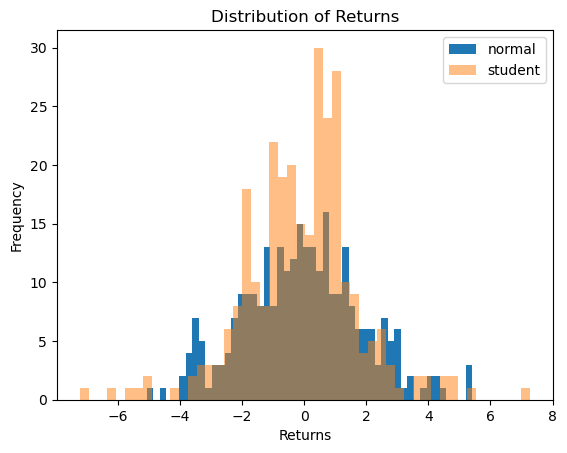

In [10]:
plt.hist(returns_n.iloc[:,0], bins=50, label="normal")
plt.hist(returns_t.iloc[:,0], bins=50, alpha=0.5, label="student")
plt.xlabel('Returns')
plt.ylabel('Frequency')
plt.title('Distribution of Returns')
plt.legend()
plt.show()


In [11]:
print(f"Normal Var: {np.var(returns_n.iloc[:,0])}")
print(f"Student-t Var: {np.var(returns_t.iloc[:,0])}")

Normal Var: 3.6573576880615977
Student-t Var: 3.3040056289294677


## Cross-validation

In [12]:
INITIAL_CV_WINDOW = 298
CV_END = 300

### Databases

In [13]:
N_REPS = 2

database_simulations = {}
database_simulations["normal"] = {}
database_simulations["student"] = {}

for n_rep in range(N_REPS):
    # Density processes
    pdf_normal = sim.generate_base_density(
                                        grid=x, 
                                        #    sigma=0.0067,
                                        sigma=2, 
                                        mu=0
                                        )
    pdf_t      = sim.generate_base_density(
                                        grid=x, 
                                        kind='student_t', 
                                        df=4, 
                                        #    scale=0.0067*(1/np.sqrt(2)),
                                            scale=np.sqrt(2)
                                        )
    
    # Sample returns
    returns_n = sim_engine_n.get_samples_df(n_samples=N_RETURNS)
    database_simulations["normal"][n_rep] = returns_n
    returns_t = sim_engine_t.get_samples_df(n_samples=N_RETURNS)
    database_simulations["student"][n_rep] = returns_n
    # returns_dfs = {
    #     "normal":  returns_n,
    #     "student": returns_t
    #     }
    

In [14]:
joblib.dump(database_simulations, f"{FILES_PATH}simulated_returns.jbl")

['../data/interim/simulation/20260405/simulated_returns.jbl']

### KDE + bandwidth params

In [15]:
t_dfs = range(3,6)


rot_grid = {
    "method": ["rot"],
    "kernel": ["gaussian", "epanechnikov"],
    "sigma_robust": [True, False]
}

lcv_sklearn_grid = {
    "method": ["cross_validate"],
    "kernel": ["gaussian"], 
    "cv": ["LOO"]#[5]
}

adaptive_grid = {
    "method": ["adaptive"], 
    "kernel": ["gaussian", "epanechnikov"]
}

lcv_t_grid = {
    "method": ["cross_validate"],
    "kernel": ["t-student"],
    "df": [df for df in t_dfs],
    "cv": ["LOO"]
}

adaptive_grid_t = {
    "method": ["adaptive"], 
    "kernel": ["t-student"],
    "df": [df for df in t_dfs],
}


density_param_grid = {}
for grid in [rot_grid, lcv_sklearn_grid, lcv_t_grid, adaptive_grid, adaptive_grid_t]:
    for params in ParameterGrid(grid):
        
        key_parts = [params["kernel"]]
        if "method" in params: key_parts.append(params["method"])
        if "df" in params: key_parts.append(f"df={params['df']}")
        if params.get("sigma_robust"): key_parts.append("robust")
        if params.get("cv") == "LOO": key_parts.append("loo")
        
        full_model_name = "_".join(key_parts).replace(".", "")
        
        kernel_label = params["kernel"]
        if "df" in params:
            kernel_label += f"+df={params['df']}"
            
        bw_label = params.get("method", "fixed")
        if params.get("sigma_robust"): bw_label += "_robust"
        if params.get("cv") == "LOO": bw_label += "_loo"


        density_param_grid[full_model_name] = {
            "kernel": kernel_label,
            "bandwidth": bw_label,
            "params": params  
        }

print("KDE models:")
for name, values in density_param_grid.items():
    print("\t",name, ":", values["params"])

print(f"Total KDE models: {len(density_param_grid.items())}")

KDE models:
	 gaussian_rot_robust : {'kernel': 'gaussian', 'method': 'rot', 'sigma_robust': True}
	 gaussian_rot : {'kernel': 'gaussian', 'method': 'rot', 'sigma_robust': False}
	 epanechnikov_rot_robust : {'kernel': 'epanechnikov', 'method': 'rot', 'sigma_robust': True}
	 epanechnikov_rot : {'kernel': 'epanechnikov', 'method': 'rot', 'sigma_robust': False}
	 gaussian_cross_validate_loo : {'cv': 'LOO', 'kernel': 'gaussian', 'method': 'cross_validate'}
	 t-student_cross_validate_df=3_loo : {'cv': 'LOO', 'df': 3, 'kernel': 't-student', 'method': 'cross_validate'}
	 t-student_cross_validate_df=4_loo : {'cv': 'LOO', 'df': 4, 'kernel': 't-student', 'method': 'cross_validate'}
	 t-student_cross_validate_df=5_loo : {'cv': 'LOO', 'df': 5, 'kernel': 't-student', 'method': 'cross_validate'}
	 gaussian_adaptive : {'kernel': 'gaussian', 'method': 'adaptive'}
	 epanechnikov_adaptive : {'kernel': 'epanechnikov', 'method': 'adaptive'}
	 t-student_adaptive_df=3 : {'df': 3, 'kernel': 't-student', 'meth

In [ ]:
kde_databases = {}
for database_name, database in database_simulations.items():
    kde_databases[database_name] = {}
    database_reps = database_simulations[database_name]
    
    for n_rep, df in database_reps.items():
        returns_df = database_reps[n_rep]
        returns_df_validation_set = returns_df.iloc[:,:CV_END]
        kde_databases[database_name][n_rep] = {}

        for kde_bw_name, kde_bw_params in density_param_grid.items():
            print(f"Processing configuration for database = {database_name}, simulation n. = {n_rep}: {kde_bw_name}")
            
            # bandwidths
            df_h = kde.df_bandwidth_selector(returns_df_validation_set, **kde_bw_params["params"])    
            kde_params = {k: v for k, v in kde_bw_params["params"].items() if k in ['kernel', 'df']}
            
            # kdes
            df_grids, df_densities = kde.df_to_kde(
                X=returns_df_validation_set, 
                h=df_h, 
                normalize_densities=False,
                **kde_params
            )

            kde_databases[database_name][n_rep][kde_bw_name] = {
                        "df_h":         df_h,
                        "df_grids":     df_grids,
                        "df_densities": df_densities,
                        "params":       kde_params 
                    }

Processing configuration for database = normal, simulation n. = 0: gaussian_rot_robust


In [135]:
# To Store
joblib.dump(database_simulations, f"{FILES_PATH}simulated_returns_kdes.jbl")

# To Read
kde_databases = joblib.load(f"{FILES_PATH}simulated_returns_kdes.jbl")

In [ ]:
# Compute KDEs
# kde_databases = {}
# for database_name, database in returns_dfs.items():
#     kde_databases[database_name] = {}

#     returns_df = returns_dfs[database_name]
#     returns_df_validation_set = returns_df.iloc[:,:CV_END]

#     for kde_bw_name, kde_bw_params in density_param_grid.items():
#         print(f"Processing configuration for database = {database_name}: {kde_bw_name}")
        
#         # bandwidths
#         df_h = kde.df_bandwidth_selector(returns_df_validation_set, **kde_bw_params["params"])    
#         kde_params = {k: v for k, v in kde_bw_params["params"].items() if k in ['kernel', 'df']}
        
#         # kdes
#         df_grids, df_densities = kde.df_to_kde(
#             X=returns_df_validation_set, 
#             h=df_h, 
#             normalize_densities=False,
#             **kde_params
#         )

#         kde_databases[database_name][kde_bw_name] = {
#                     "df_h":         df_h,
#                     "df_grids":     df_grids,
#                     "df_densities": df_densities,
#                     "params":       kde_params 
#                 }


Processing configuration for database = normal: gaussian_rot_robust
Processing configuration for database = normal: gaussian_rot
Processing configuration for database = normal: epanechnikov_rot_robust
Processing configuration for database = normal: epanechnikov_rot
Processing configuration for database = normal: gaussian_cross_validate_loo
Processing configuration for database = normal: t-student_cross_validate_df=3_loo
Processing configuration for database = normal: t-student_cross_validate_df=4_loo
Processing configuration for database = normal: t-student_cross_validate_df=5_loo
Processing configuration for database = normal: gaussian_adaptive
Processing configuration for database = normal: epanechnikov_adaptive
Processing configuration for database = normal: t-student_adaptive_df=3
Processing configuration for database = normal: t-student_adaptive_df=4
Processing configuration for database = normal: t-student_adaptive_df=5
Processing configuration for database = student: gaussian_ro

In [ ]:
# # To Store
# joblib.dump(kde_databases, ALL_KDES_PATH)

# # To Read
# kde_databases = joblib.load(ALL_KDES_PATH)

### FPC params

In [64]:
# Basic dFPC setup
KdFPC_kwargs = {
    "p": 5,
    "select_ncomp": "variance"
}

### Cross validation

In [65]:
# 1. Setup Logger
logger = logging.getLogger("Density_Estimation")
logger.setLevel(logging.DEBUG)

# 2. Setup File Handler
file_handler = logging.FileHandler(LOG_PATH)
file_handler.setFormatter(logging.Formatter('%(asctime)s | %(levelname)s | %(message)s'))
logger.addHandler(file_handler)

# 3. CAPTURE WARNINGS: This handles "Forecast with mean" style warnings
logging.captureWarnings(True)

In [141]:
for database_name, reps in database_simulations.items():
    print(reps)

{0:      2025-06-10  2025-06-11  2025-06-12  2025-06-13  2025-06-14  2025-06-15  \
0      0.887956    0.913118    2.383519    0.909217    0.578965   -0.354904   
1     -0.062602    0.200303    0.443718   -1.042903    0.006485   -4.387415   
2      1.298972    0.060804    1.912471   -1.048105   -3.805488    2.941486   
3      0.285735   -0.863567   -1.130037   -1.050534    0.709847    0.972226   
4     -1.353553   -2.927701    4.409074   -3.113428   -2.396370    1.664970   
..          ...         ...         ...         ...         ...         ...   
283   -2.052231   -1.355925    5.243241    1.203148    0.838902    0.819163   
284    2.303844    0.375249    3.258128   -1.742247   -0.907572    0.631960   
285   -0.012377   -1.509746    0.890496   -0.408519   -2.406190    1.193966   
286    0.848896    0.181236    3.793241    1.553641   -1.422091    2.453009   
287    2.127862    2.685017   -3.412719    0.371422    0.139576   -0.350914   

     2025-06-16  2025-06-17  2025-06-18  2025-0

In [144]:
database_selection

,2025-06-10,2025-06-11,2025-06-12,2025-06-13,2025-06-14,2025-06-15,2025-06-16,2025-06-17,2025-06-18,2025-06-19,...,2026-03-27,2026-03-28,2026-03-29,2026-03-30,2026-03-31,2026-04-01,2026-04-02,2026-04-03,2026-04-04,2026-04-05
0,0.887956,0.913118,2.383519,0.909217,0.578965,-0.354904,-1.839297,-4.284077,-2.776420,-3.041414,...,1.225024,3.725753,0.120890,6.052297,-0.889819,-0.138652,0.254901,-0.745170,0.507375,-0.579049
1,-0.062602,0.200303,0.443718,-1.042903,0.006485,-4.387415,0.339274,2.177900,0.939650,-1.066729,...,-0.736212,2.550404,4.289122,-3.683907,-0.359987,2.014265,-0.744187,1.469828,0.909401,-0.224980
2,1.298972,0.060804,1.912471,-1.048105,-3.805488,2.941486,2.933023,-0.317409,-0.564732,-3.365349,...,1.112917,0.256955,-0.027370,-4.125699,2.543168,-1.494040,-0.499449,-0.023129,0.096168,2.588295
3,0.285735,-0.863567,-1.130037,-1.050534,0.709847,0.972226,2.805584,0.260704,-0.043126,-3.082038,...,1.015633,2.767715,-0.780722,2.734063,0.344884,0.285045,0.541096,0.102298,-3.919320,-1.541936
4,-1.353553,-2.927701,4.409074,-3.113428,-2.396370,1.664970,-4.285765,-1.150046,-1.639633,-1.064580,...,3.092205,2.171619,2.519061,0.645616,2.360208,3.811511,1.439243,2.136727,-4.937809,2.383643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,-2.052231,-1.355925,5.243241,1.203148,0.838902,0.819163,-0.973520,0.867947,-2.758504,2.458400,...,-1.422776,1.195529,-0.896906,-0.311805,-3.195235,0.439214,1.015908,4.706975,3.011068,1.746788
284,2.303844,0.375249,3.258128,-1.742247,-0.907572,0.631960,-0.180641,0.842398,-1.854549,0.147050,...,2.597493,4.336844,-0.900215,0.587254,2.275045,-1.924690,-2.828641,-2.435662,1.788078,-2.673379
285,-0.012377,-1.509746,0.890496,-0.408519,-2.406190,1.193966,-1.492203,1.577467,3.089728,-0.860812,...,2.046096,4.928890,1.150042,2.469190,-3.365626,-1.047167,-1.050844,0.876987,-0.408922,-0.853762
286,0.848896,0.181236,3.793241,1.553641,-1.422091,2.453009,0.580187,-1.216701,-1.944501,0.927963,...,1.627398,3.316534,-1.539641,-2.101557,-0.278541,-0.532681,2.146592,3.860475,-1.870860,2.800924


In [143]:
total_params = (len(returns_dfs) * len(density_param_grid))# * len(dimensions_list) * len(var_qs))
pbar = tqdm(total=total_params, desc="Total CV Progress")

current_count = 1
all_records = []
cv_database = {}

for database_name, database in database_simulations.items():
    cv_database[database_name] = {}
    database_reps = database_simulations[database_name]
    
    for n_rep, df in database_reps.items():
        df_rep = database_reps[n_rep]
        returns_df_validation_set = df_rep.iloc[:,:CV_END]
        database_selection = kde_databases[database_name][n_rep]

        for kde_model_name, kde_model_params in density_param_grid.items():
            database_selection_model = database_selection[kde_model_name]
            print(f"Processing configuration: {name}")
            logger.info(
                        f"Progress: ({current_count}/{total_params}) | "
                        f"Database: {database_name} | KDE model: {kde_model_name}"
                    )
            
            # bandwidths
            kde_params = {k: v for k, v in kde_model_params["params"].items() if k in ['kernel', 'df']}
            
            # kdes
            df_support, df_densities = database_selection_model["df_grids"], database_selection_model["df_densities"]

            try:
                cv_fpc_measures, dfpc_cv_curves = crossVal.cv(
                                df_densities, 
                                df_support, 
                                KdFPC_kwargs = KdFPC_kwargs, 
                                var_lags=None, 
                                initial_window=INITIAL_CV_WINDOW,
                                return_curves=True
                                )

            except Exception as e:
                logger.exception(f"\t ERROR")
                continue
            
            metadata = {
                "database_name": database_name,
                # "full_model_name": full_model_name,
                "model_kernel": kde_model_params["kernel"],
                "model_bandwidth": kde_model_params["bandwidth"],
                # "dFPC_dimensions": d,
            }

            records = format_records(cv_fpc_measures, dfpc_cv_curves, metadata)
            all_records.extend(records)
            df_mdfpc_records = pd.DataFrame(records)
            # joblib.dump(df_mdfpc_records, f'../data/interim/simulation/{EXECUTION_DATE}/{full_model_name}.jbl', compress=3)

            pbar.update(1)
            current_count += 1

df_cv = pd.DataFrame(all_records)

Total CV Progress:   0%|          | 0/26 [00:00<?, ?it/s]

KeyError: 'gaussian_rot_robust'

In [67]:
df_cv = pd.DataFrame(all_records)
df_cv

,database_name,model_kernel,model_bandwidth,fold,KLD,JSD,L_1,L_2,L_INFTY,curves
0,normal,gaussian,rot_robust,1,0.082738,0.004115,11332.184989,285.929638,13.048045,actual forecast fo...
1,normal,gaussian,rot_robust,2,0.087266,0.003833,9506.150787,230.545142,10.115641,actual forecast fo...
2,normal,gaussian,rot,1,0.074318,0.004111,12095.115834,295.311101,12.933944,actual forecast fo...
3,normal,gaussian,rot,2,0.072734,0.003450,9725.152875,227.640629,9.448938,actual forecast fo...
4,normal,epanechnikov,rot_robust,1,0.205024,0.003445,6736.611047,207.937845,11.808634,actual forecast fo...
5,normal,epanechnikov,rot_robust,2,0.200506,0.004238,7284.143506,200.877930,9.924106,actual forecast fo...
6,normal,epanechnikov,rot,1,0.200802,0.003437,6729.924493,207.518974,11.812502,actual forecast fo...
7,normal,epanechnikov,rot,2,0.179438,0.003789,7092.699948,193.067538,9.414062,actual forecast fo...
8,normal,gaussian,cross_validate_loo,1,0.245548,0.007723,10417.036600,304.108135,20.660551,actual forecast fo...
9,normal,gaussian,cross_validate_loo,2,0.197666,0.005985,8521.560453,232.326309,10.923096,actual forecast fo...


In [68]:
accuracy_measures = ["KLD", "JSD", "L_1", "L_2", "L_INFTY"]
df_cv["kde_bw_model"] = df_cv["model_kernel"] + "___" + df_cv["model_bandwidth"]
df_cv.groupby("kde_bw_model")[accuracy_measures].mean().sort_values(by="KLD")

,KLD,JSD,L_1,L_2,L_INFTY
kde_bw_model,,,,,
t-student+df=3___adaptive,0.039241,0.002749,8327.085315,195.810426,9.432103
t-student+df=4___adaptive,0.042029,0.002916,8546.421269,202.372509,9.754424
t-student+df=5___adaptive,0.043810,0.003027,8689.536559,206.591634,9.963366
gaussian___adaptive,0.050079,0.003587,9296.842359,226.480839,11.029967
t-student+df=3___cross_validate_loo,0.059146,0.003269,8325.770453,198.032267,9.052772
t-student+df=5___cross_validate_loo,0.086412,0.003083,8579.092385,198.837986,8.559294
t-student+df=4___cross_validate_loo,0.086967,0.003141,8568.548682,198.664697,8.801265
gaussian___rot,0.098355,0.002791,6989.197384,172.128714,7.868538
gaussian___rot_robust,0.115581,0.003243,7127.995692,184.038468,8.839563


In [15]:
df_cv[df_cv.kde_params.str.contains("student")].iloc[1,:]["curves"].query("fold==4").plot()

IndexError: single positional indexer is out-of-bounds